# Test on different datasets

In [1]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
import os
import os.path as osp
from io import BytesIO
import requests

In [2]:
import tensorflow as tf
import numpy as np
from PIL import Image as Image

import menpo
import menpo.io as mio
import matplotlib.pyplot as plt

from menpo.shape import PointCloud
from menpo.transform import Translation, Scale
from menpofit.transform import DifferentiableAlignmentSimilarity

import networks
import detect_face
from flags import FLAGS

np.set_printoptions(3)
slim = tf.contrib.slim
%matplotlib inline

## Init Networks
### MCTNN

In [3]:
minsize = 40 # minimum size of face
threshold = [ 0.6, 0.7, 0.7 ]  # three steps's threshold
factor = 0.709 # scale factor

with tf.Graph().as_default():
    sess = tf.Session()
    with sess.as_default():
        pnet, rnet, onet = detect_face.create_detector(sess, './detection')

./detection/cas3.npy True


### init DNFaceMultiview

In [4]:
def tf_heatmap_to_lms(heatmap):
    hs = tf.argmax(tf.reduce_max(heatmap, 2), 1)
    ws = tf.argmax(tf.reduce_max(heatmap, 1), 1)

    lms = tf.transpose(tf.to_float(tf.stack([hs, ws])), perm=[1, 2, 0])
    return lms

In [5]:
model_path = './ckpt/2D86/model.ckpt-217348'
template = mio.import_pickle('./image/template.pkl.gz')

n_landmarks = 86
FLAGS.n_landmarks = 86

with tf.Graph().as_default() as g:
    images_input = tf.placeholder(tf.float32, shape=(None, None, None, 3), name='input_images')
    net_model = networks.DNFaceMultiView('')
    
    with tf.variable_scope('net'):
        lms_heatmap_prediction, states = net_model._build_network(images_input, datas=None, is_training=False, 
                                                                 n_channels=n_landmarks)
        pts_predictions = tf_heatmap_to_lms(lms_heatmap_prediction)
        variables_to_restore = slim.get_variables_to_restore()
        saver = tf.train.Saver(variables_to_restore)

config = tf.ConfigProto()
config.gpu_options.allow_growth = True
sess = tf.Session(config=config,graph=g)

saver.restore(sess, model_path)

/home/z/miniconda3/envs/abg10/lib/python3.6/site-packages/menpo/shape/labelled.py:212: MenpoDeprecationWarning: menpo.landmark.LandmarkGroup is now deprecated and has been moved to menpo.shape.LandmarkGroup.
  MenpoDeprecationWarning)


INFO:tensorflow:Restoring parameters from ./ckpt/2D86/model.ckpt-217348


### utils

In [6]:
def crop_image_bounding_box(img, bbox, res, base=256., order=1, points=None, show=0, debug=False):

    center = bbox.centre()
    bmin, bmax = bbox.bounds()
    scale = np.linalg.norm(bmax - bmin) / base
    if debug:
        print("center", center)
        print("minmax", bmin, bmax)
        print("scale", scale)
        print("init size", img.shape)

    return crop_image(img, center, scale, res, base, order=order, bmin=bmin, bmax=bmax, points=points, show=show, debug=debug)

def crop_image(img, center, scale, res, base=256., order=1, show=1, bmin=None, bmax=None, points=None, debug=False):
    h = scale
    t = Translation(
        [
            res[0] * (-center[0] / h + .5),
            res[1] * (-center[1] / h + .5)
        ]).compose_after(Scale((res[0] / h, res[1] / h))).pseudoinverse()

    # Upper left point
    ul = np.floor(t.apply([0, 0]))
    # Bottom right point
    br = np.ceil(t.apply(res).astype(np.int))
    
    if show:
        plt.figure(figsize=(18,8))
        
        plt.subplot(1,3,1)
        plt.title("Original Image, MTCNN Detection")
        plt.imshow(img.as_PILImage())

        ulbr = np.vstack((ul, br)).T
        plt.scatter(ulbr[1], ulbr[0])
        
        width, height = (br - ul).astype(np.int)
        p = plt.Rectangle(ul[::-1], height, width, fill=False,  color='g')
        plt.gca().add_patch(p)
        plt.text(*(br[::-1]), "crop dim", c='g')
        
        if points is not None:
            pts = points[:,0].reshape(2,5)
            plt.scatter(pts[0], pts[1])
        
    if show and bmin is not None and bmax is not None:

        bminmax = np.vstack((bmin, bmax)).T
        if debug:
            print(bminmax)        
        
        width, height = (bmax - bmin)
        p = plt.Rectangle(bmin[::-1], height, width, fill=False, color='r')
        plt.gca().add_patch(p)
        plt.text(*(bmax[::-1]), "MTCNN box", c='r')

        plt.scatter(bminmax[1], bminmax[0], marker="x")
        plt.scatter(*(center[::-1]), marker="+", c='y')
        
        #plt.show()
    
    # crop and rescale
    cimg, trans = img.warp_to_shape(
        br - ul, Translation(-(br - ul) / 2 + (br + ul) / 2), return_transform=True)

    if show:
        plt.subplot(1,3,2)
        plt.title("Cropped Image\n %s, %s"%(str(ul), str(br)))
        plt.imshow(cimg.as_PILImage())

    c_scale = np.min(cimg.shape) / np.mean(res)
    new_img = cimg.rescale(1 / c_scale, order=order).resize(res, order=order)
    trans = trans.compose_after(Scale([c_scale, c_scale]))
    
    if show > 1:
        plt.subplot(1,3,3)
        plt.title("re sized %s"% str(new_img.shape))
        plt.imshow(new_img.as_PILImage())

    if show > 1:
        plt.show()
    
    return new_img, trans

In [7]:
def prepare_for_landmarks(image, bounding_boxes, points, show=1, debug=False):
    image_ID_name = osp.splitext(osp.basename(image.path))[0]
    # remove path out if image
    batch_pixels = []
    batch_trans = []
    batch_image_names = []

    for box_index in np.arange(bounding_boxes.shape[0]):
        
        bbox = PointCloud(bounding_boxes[box_index,[1,0,3,2]].reshape([2,2])).bounding_box()
        crop_img, crop_trans = crop_image_bounding_box(image, bbox, [256., 256.], base=256./256.,
                                                       order=1, points=points, show=show, debug=debug)
        if debug:
            print(crop_trans)
        input_pixels = crop_img.pixels_with_channels_at_back()
        batch_pixels.append(input_pixels)
        batch_trans.append(crop_trans)
        batch_image_names.append('./image/' + image_ID_name + '__' + str(box_index) + '.pts')
    return batch_pixels, batch_trans, batch_image_names

In [8]:
def showmempo_template(template, image):
    mask_index = np.arange(68)
    lm = template.landmarks['PTS']
    image.view()
    image.landmarks['PTS']= orig_pts
    template.landmarks['PTS'].points = image.landmarks['PTS'].points[mask_index,0:2]
    lm = template.landmarks['PTS']
    lm.view(marker_size=5,render_numbering=True)  

In [9]:
def loadimg(url, crop=None):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    if crop is not None:
        img = img.crop(crop)
    return img

def scrape(urls, store_folder, crops=None, ext=".jpg"):
    for i, url in enumerate(urls):
        crop = None if crops is None else crops[i]
        img = loadimg(url, crop)
        img.save(osp.join(store_folder, url.split("=")[-1]+ext))

## Test different datasets
### from the web

In [10]:
urls =['https://i.guim.co.uk/img/media/190ed2590083bf8e2826cd3c7a60ba93dbaebc2c/0_261_3000_1800/master/3000.jpg?width=1920&quality=85&auto=format&fit=max&s=5e0aa35033b6e86b8d611a2a8444f75a',
       'https://i.guim.co.uk/img/media/8c0be6c2e30e5bdf3ddde1fb2e7567b1d529c6e9/0_0_2000_3000/master/2000..jpg?width=1920&quality=85&auto=format&fit=max&s=725392d3eac55aba65c2c3d24c29c2b7']
ext = ".jpg"
folder = osp.abspath("image")

test_files = [osp.join(folder, url.split("=")[-1]+ext) for url in urls]
files = [f for f in os.listdir(folder) if osp.isfile(osp.join(folder, f))]
urls = [url for url in urls if url.split("=")[-1]+ext not in files]
scrape(urls, store_folder=folder, crops=None, ext=ext)


In [11]:
test_files

['/home/z/work/gits/Face/Face_Detection_Alignment/image/5e0aa35033b6e86b8d611a2a8444f75a.jpg',
 '/home/z/work/gits/Face/Face_Detection_Alignment/image/725392d3eac55aba65c2c3d24c29c2b7.jpg']

In [12]:
img = test_files[0]

In [13]:
im = np.array(Image.open(img))
bounding_boxes, points = detect_face.detect_face(im.astype(np.float32), minsize, pnet, rnet, onet, threshold, factor)

0 faces found


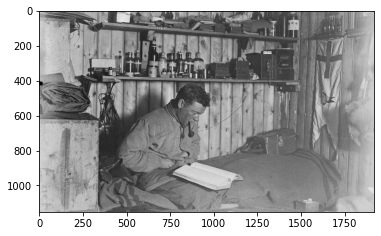

In [14]:
print(bounding_boxes.shape[0], "faces found")
plt.imshow(im)
plt.show()

Why did MCTNN not find what is clearly a face to any human? Simply it wasn't trained for this statistic. This demonstrates that no matter how good the training set is, the statistical approach fails. One could keep on piling data, or creating ever more complex networks that consider not just the statistics but also the context, and yet this approach will result in an infinitely narrow solution: there will always be a case where us humans see a face and MCTNN fails to find it.

In [15]:
img = test_files[1]
im = np.array(Image.open(img))
bounding_boxes, points = detect_face.detect_face(im.astype(np.float32), minsize,
                                                 pnet, rnet, onet, threshold, factor)

1 faces found
center [1738.73   845.704]
minmax [1476.481  661.118] [2000.979 1030.291]
scale 641.3941036407066
init size (2880, 1920)
[[1476.481 2000.979]
 [ 661.118 1030.291]]
Similarity decomposing into:  
  CCW Rotation of 0.0 degrees about [0 0 1]
  UniformScale by 2.50390625
  CCW Rotation of 0.0 degrees about [0 0 1]
  Translation by [1418.  525.]
[[2.504e+00 0.000e+00 1.418e+03]
 [0.000e+00 2.504e+00 5.250e+02]
 [0.000e+00 0.000e+00 1.000e+00]]


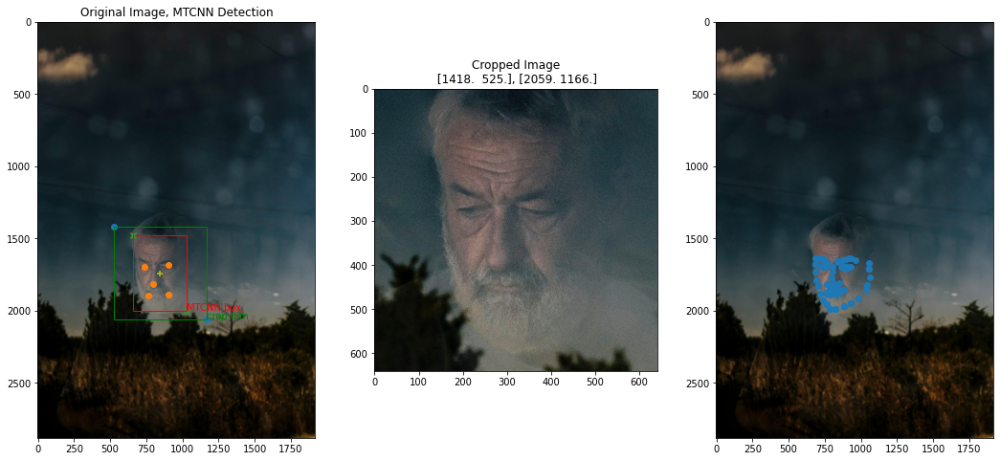

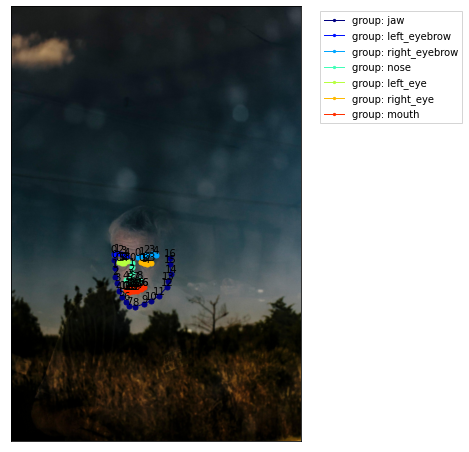

In [16]:
print(bounding_boxes.shape[0], "faces found")
# TODO remove warp and crop and transform from image class
image = mio.import_image(img)  
batch_pixels, batch_trans, batch_image_names = prepare_for_landmarks(image, bounding_boxes, points, show=1, debug=True)
plt.subplot(1,3,3)

pts_pred = sess.run(
    pts_predictions,
    feed_dict={images_input: np.stack(batch_pixels, axis=0)})

for inner_batch_index in np.arange(bounding_boxes.shape[0]):
    orig_pts = batch_trans[inner_batch_index].apply(PointCloud(pts_pred[inner_batch_index]))
    img = test_files[1]
#plt.figure(figsize=(10,10))
plt.imshow(Image.open(img))
plt.scatter(orig_pts.points.T[1], orig_pts.points.T[0])
plt.show()
showmempo_template(template, image)

### Images randomly chosen from datasets at hand. Then loaded (in the subfolders as appear in my hw) to images.

In [17]:
imgs = ["Adience/faces/115111634@N07/coarse_tilt_aligned_face.1122.12109979636_a858e54030_o.jpg",
        "Adience/faces/62501130@N02/coarse_tilt_aligned_face.97.11399525103_515cbc4d6c_o.jpg",
        "CelebA/img_align_celeba/157776.jpg","CelebA/img_align_celeba/105312.jpg",
        "FacePoint/train/net_7876/_-40_2264_0.jpg","FacePoint/train/net_7876/_40_1330_0.jpg",
        "FacePoint/train/lfw_5590/Stacey_Yamaguchi_0001.jpg",
        "HELEN/images/2851040724_1.jpg",
        "HELEN/images/2864905534_1.jpg","HELEN/images/2807842663_1.jpg",
        "ICCV19_IBUG/iccv19-challenge-data/31/5b/315b0b3c44f7cea702f0247dc1a85bf3.jpg",
        "ICCV19_IBUG/iccv19-challenge-data/bd/f1/bdf1926c6fe685c6c401d42c1656b5a2.jpg",
        "LS3D-W/300VW-3D/CatB/412/0057.jpg","LS3D-W/300VW-3D/CatA/509/1017.jpg",
        "Mempo/helen/trainset/280469983_1.jpg","Mempo/muct/jpg/i256ta-mn.jpg",
        "MTFL/lfw_5590/Yann_Martel_0001.jpg",
        "Tiny/fg-fixed-context/S/29_Students_Schoolkids_Students_Schoolkids_29_374_obj3_ov0.5.png",
        "VGGFace2/images/n000006/0074_01.jpg","VGGFace2/images/n002454/0067_01.jpg",
        "VGGFace2/images/n000830/0017_02.jpg","LFW/berg/originalPics/2002/09/20/big/img_659.jpg",
        "LFW/lfw-deepfunneled/George_W_Bush/George_W_Bush_0352.jpg","LS3D-W-balanced-20-03-2017/1287.jpg",
        "LS3D-W-balanced-20-03-2017/33.jpg"]

/home/z/miniconda3/envs/abg10/lib/python3.6/site-packages/ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


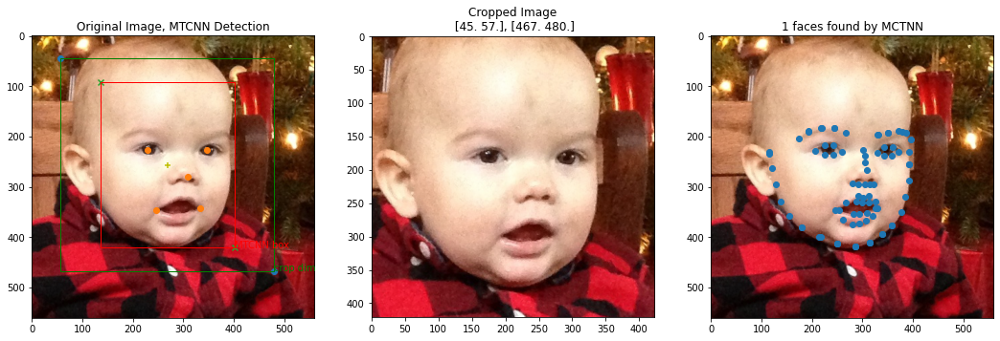

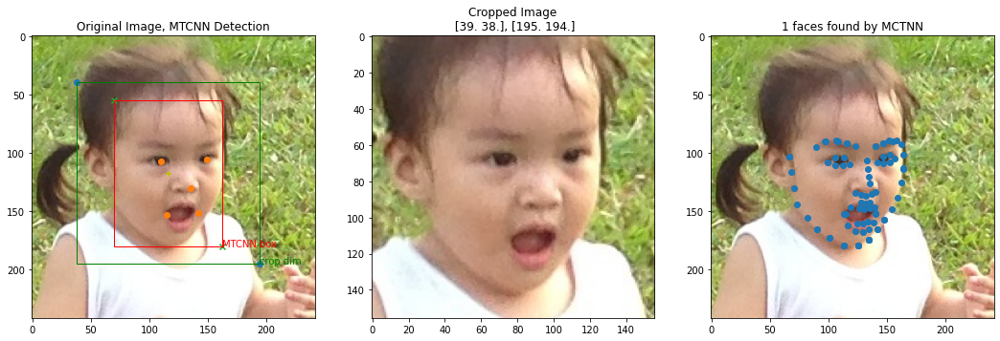

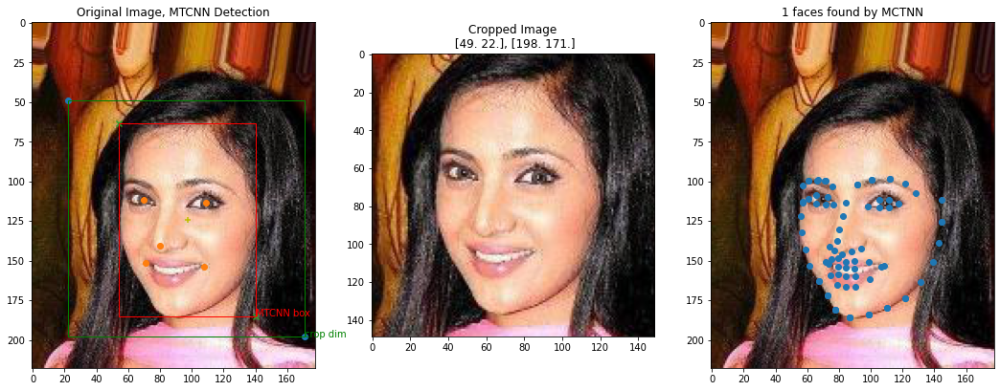

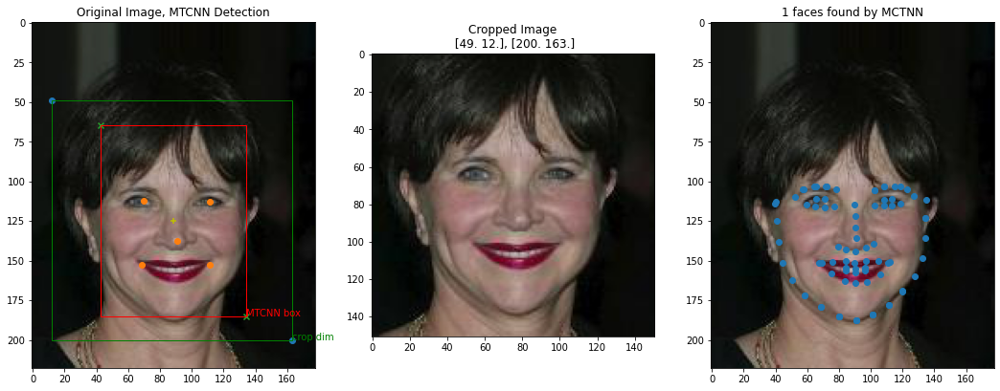

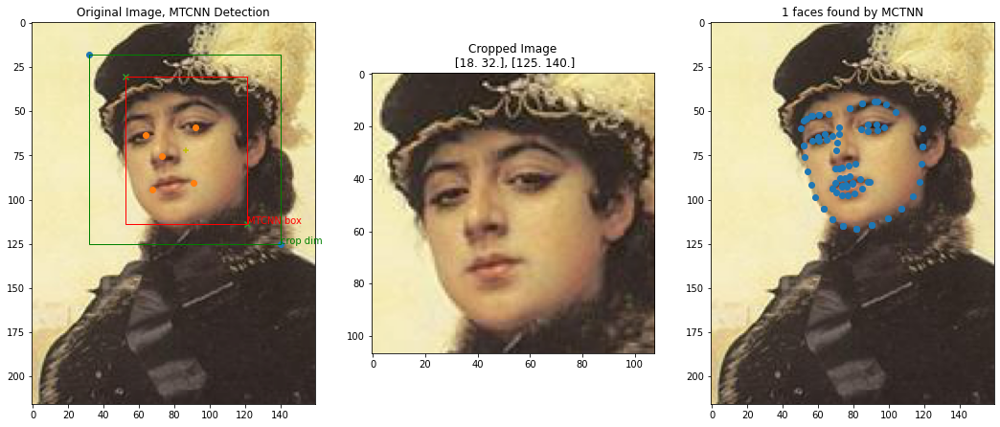

...

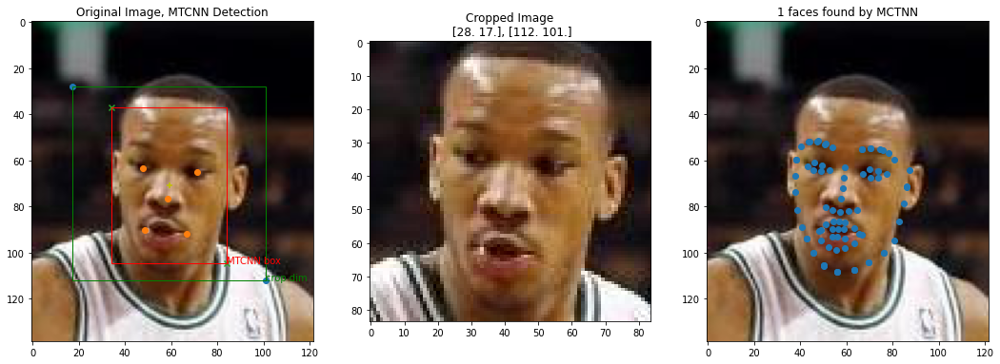

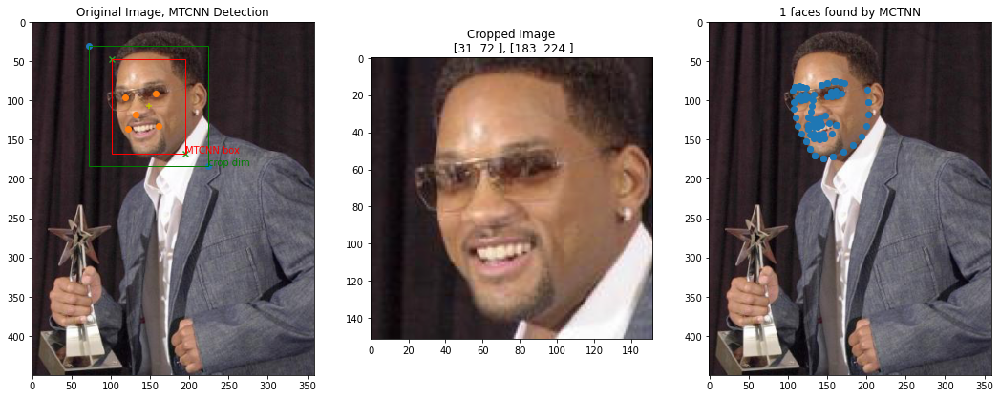

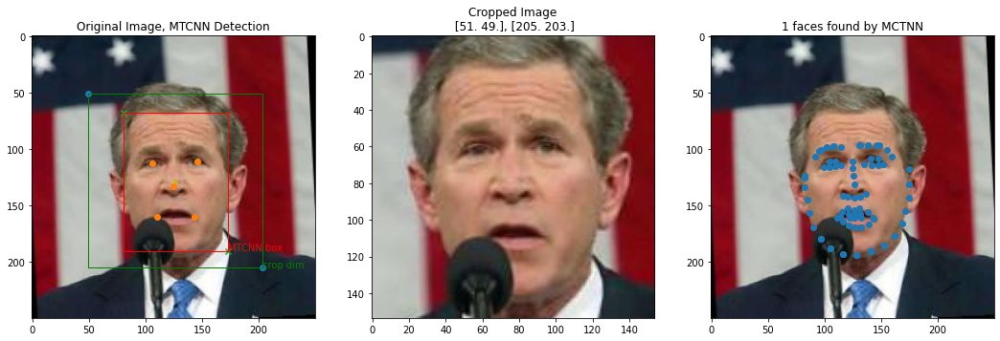

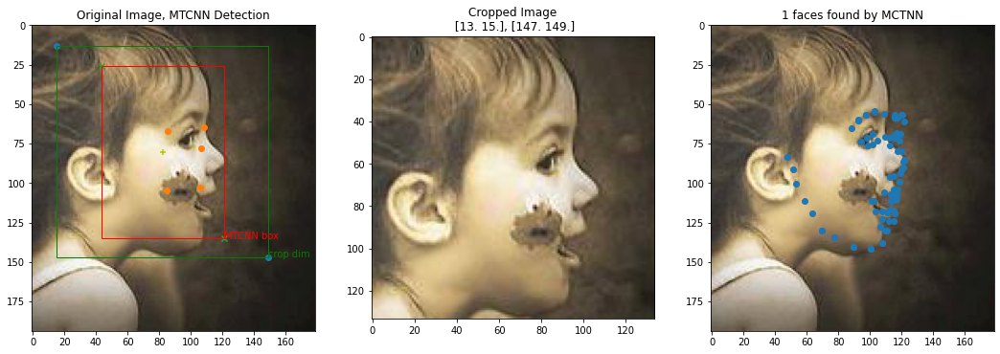

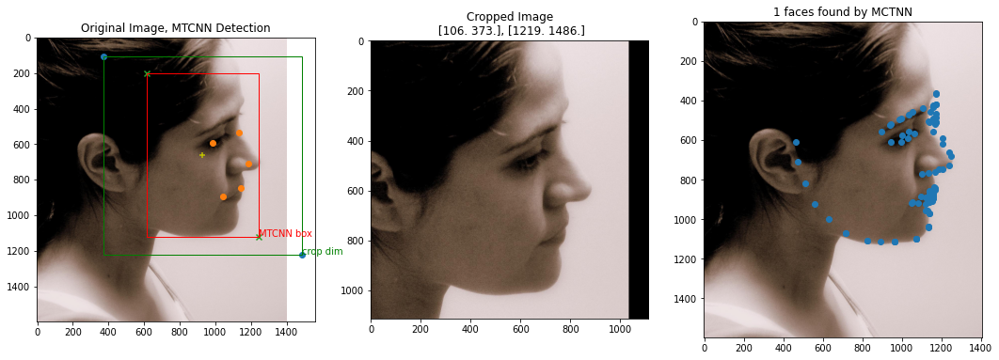

In [18]:
for img in imgs:
    img = osp.join(folder, img)
    im = np.array(Image.open(img))
    bounding_boxes, points = detect_face.detect_face(im.astype(np.float32), minsize, pnet, rnet, onet, threshold, factor)
    # TODO remove warp and crop and transform from image class
    image = mio.import_image(img)  
    batch_pixels, batch_trans, batch_image_names = prepare_for_landmarks(image, bounding_boxes, points, show=1)
    plt.subplot(1,3,3)

    pts_pred = sess.run(
        pts_predictions,
        feed_dict={images_input: np.stack(batch_pixels, axis=0)})

    for inner_batch_index in np.arange(bounding_boxes.shape[0]):
        orig_pts = batch_trans[inner_batch_index].apply(PointCloud(pts_pred[inner_batch_index]))
    #plt.figure(figsize=(10,10))
    plt.imshow(im)
    plt.title("%d faces found by MCTNN"%bounding_boxes.shape[0])
    plt.scatter(orig_pts.points.T[1], orig_pts.points.T[0])
plt.show()